In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
from tqdm import tqdm
from time import time

# TODO: Move functions to separate modules
import functions as f

import core.background_model as background_model
import core.clique_finding as cf
import core.stats 

In [3]:
# GLOBALS

TTN_BIN = 4275
BIN_MAP_PATH = 'mappings/bin_map_human_100000.bed'
GTF_PATH = 'mappings/gencode.v38.annotation.gtf'
GENE_BIN_PATH = 'mappings/gene_bins.txt'
NON_GENE_BIN_PATH = 'mappings/non_gene_bins.txt'


gene_bins = []
with open('mappings/gene_bins.txt', 'r') as file:
    for line in file:
        gene_bins.append(line.strip())
gene_bins = [int(x) for x in gene_bins]


non_gene_bins = []
with open('mappings/non_gene_bins.txt', 'r') as file:
    for line in file:
        non_gene_bins.append(line.strip())
non_gene_bins = [int(x) for x in non_gene_bins]



In [25]:
wt_matrix = np.load('data/hic/wt_1mb_zeroed.npy')

In [36]:
knockout_matrix = np.load('data/hic/full_contacts/knockout_1mb_raw.npy')

In [ ]:
ttn_clique = cf.analytical_diffusion_clique(knockout_matrix, TTN_BIN, 10, 0.3)

In [ ]:
ttn_clique

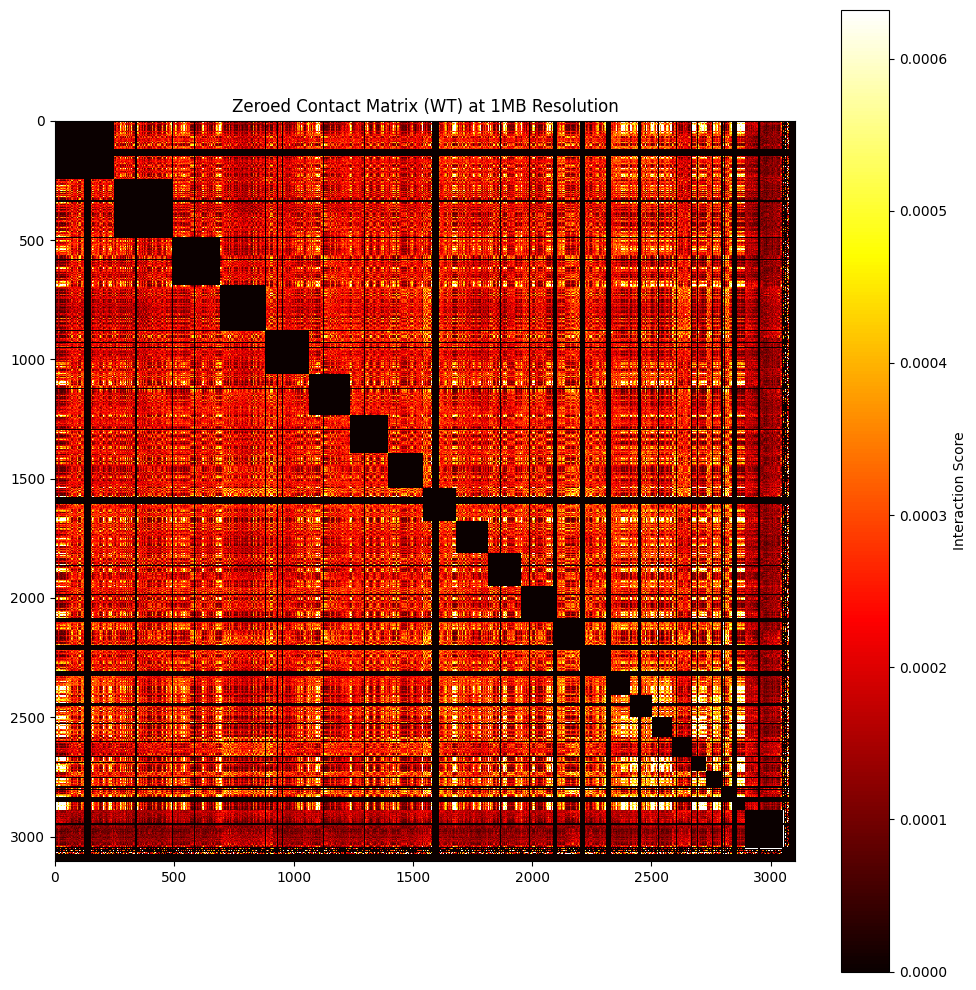

In [33]:
import numpy as np
import matplotlib.pyplot as plt

# Compute percentile for dynamic scaling
vmax = np.nanpercentile(wt_matrix, 99)

# Plot
cmap = plt.cm.hot
cmap.set_bad(color='red')  
plt.figure(figsize=(10, 10))
plt.imshow(wt_matrix, cmap=cmap, interpolation='nearest', vmin=0, vmax=vmax)
plt.colorbar(label='Interaction Score')
plt.title("Zeroed Contact Matrix (WT) at 1MB Resolution")
plt.tight_layout()
plt.savefig("contact_matrix_clipped.png", dpi=300)



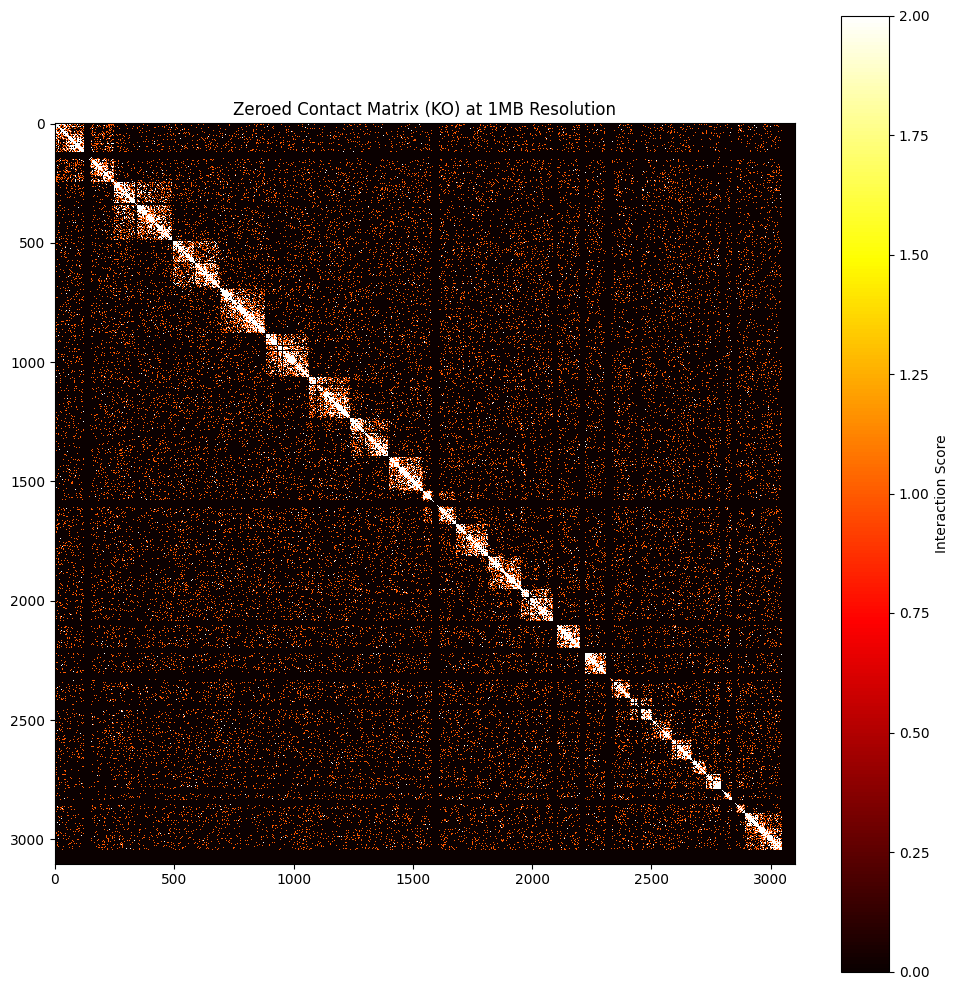

In [37]:
import numpy as np
import matplotlib.pyplot as plt

# Compute percentile for dynamic scaling
vmax = np.nanpercentile(knockout_matrix, 99)

# Plot
plt.figure(figsize=(10, 10))
plt.imshow(knockout_matrix, cmap=cmap, interpolation='nearest', vmin=0, vmax=vmax)
plt.colorbar(label='Interaction Score')
plt.title("Zeroed Contact Matrix (KO) at 1MB Resolution")
plt.tight_layout()
plt.savefig("contact_matrix_clipped.png", dpi=300)





In [4]:
f.find_ttn_bin('mappings/gencode.v38.annotation.gtf', 'mappings/bin_map_500kb.bed')


[855]

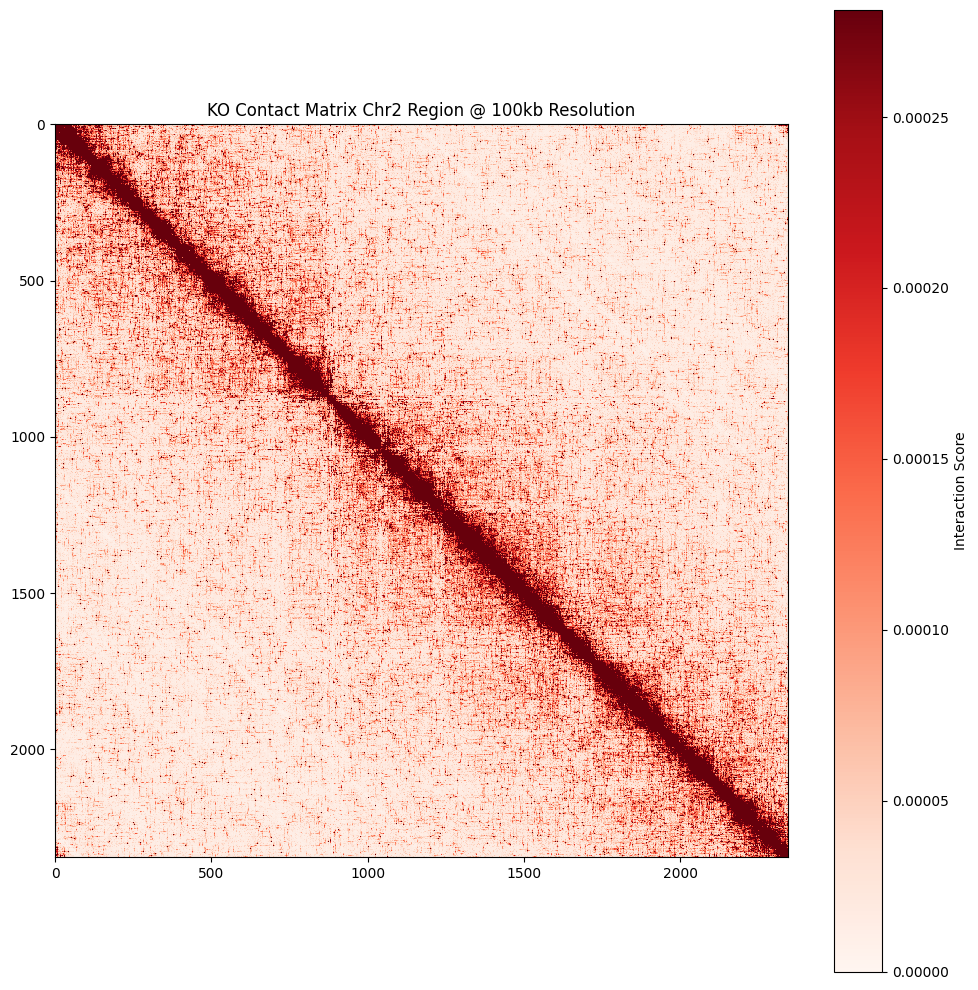

In [92]:
boosted_chr2 = np.load('samples/boosted.npy')

vmax = np.nanpercentile(boosted_chr2, 95)
cmap = plt.cm.Reds

# plotting
plt.figure(figsize=(10, 10))
plt.imshow(boosted_chr2, cmap=cmap, interpolation='nearest', vmin=0, vmax=vmax)
plt.colorbar(label='Interaction Score')
plt.title("KO Contact Matrix Chr2 Region @ 100kb Resolution")
plt.tight_layout()

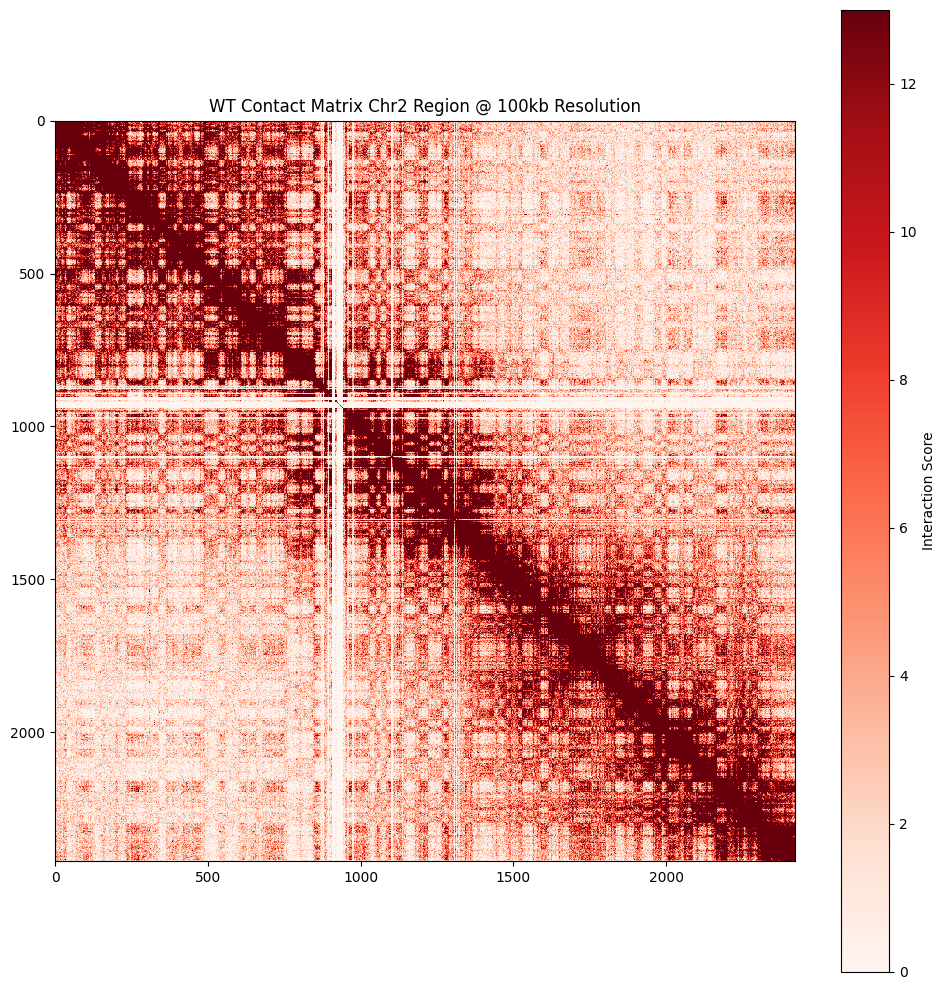

In [94]:
wildtype_matrix = np.load('data/hic/full_contacts/wt_100kb_raw.npy')
vmax = np.nanpercentile(wildtype_matrix, 99)

# filter chromosome 2
wildtype_chr2 = wildtype_matrix[2490:4912, 2490:4912]

# plotting
cmap = plt.cm.Reds
plt.figure(figsize=(10, 10))
plt.imshow(wildtype_chr2, cmap=cmap, interpolation='nearest', vmin=0, vmax=vmax)
plt.colorbar(label='Interaction Score')
plt.title("WT Contact Matrix Chr2 Region @ 100kb Resolution")
plt.tight_layout()

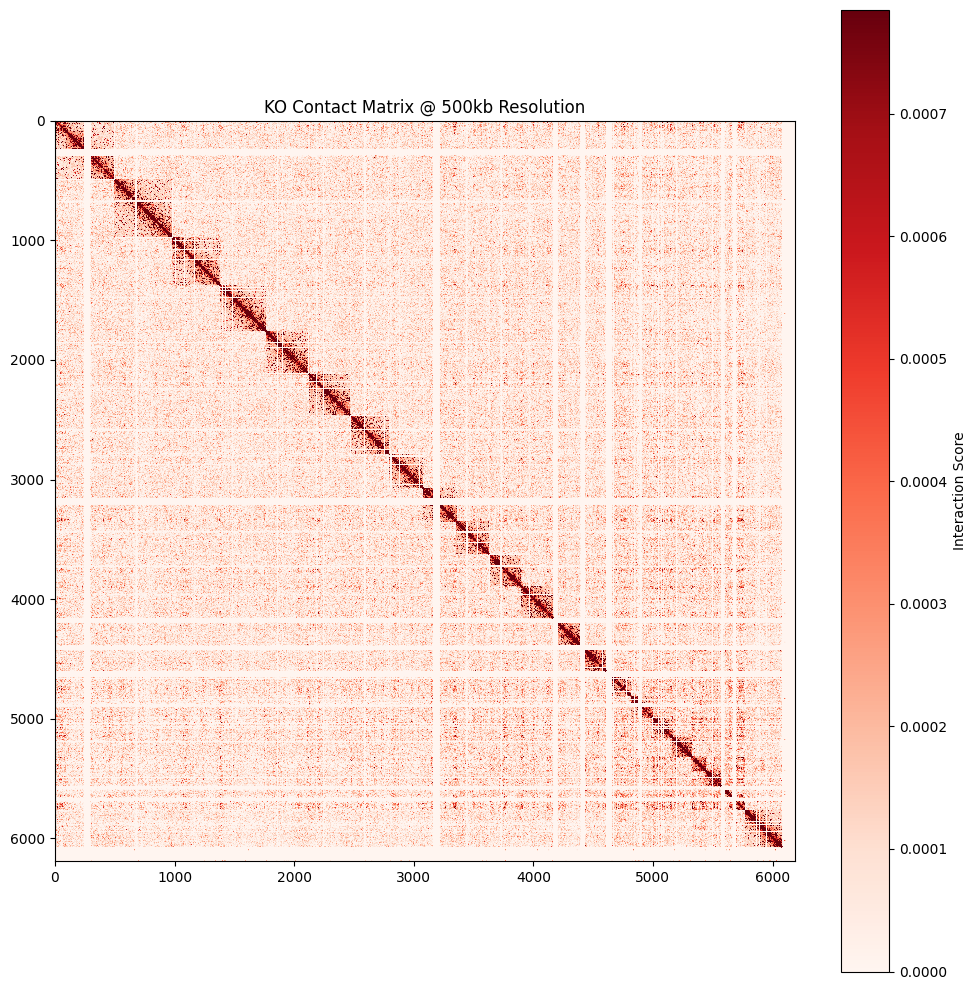

In [91]:
matrix_500kb = np.load('samples/full_imputed_500kb.npy')


# matrix_500kb = matrix_500kb[498:983, 498:983]
vmax = np.nanpercentile(matrix_500kb, 99)



cmap = plt.cm.Reds
# plot whole thjing
plt.figure(figsize=(10, 10))
plt.imshow(matrix_500kb, cmap=cmap, interpolation='nearest', vmin=0, vmax=vmax)
plt.colorbar(label='Interaction Score')
plt.title("KO Contact Matrix @ 500kb Resolution")
plt.tight_layout()

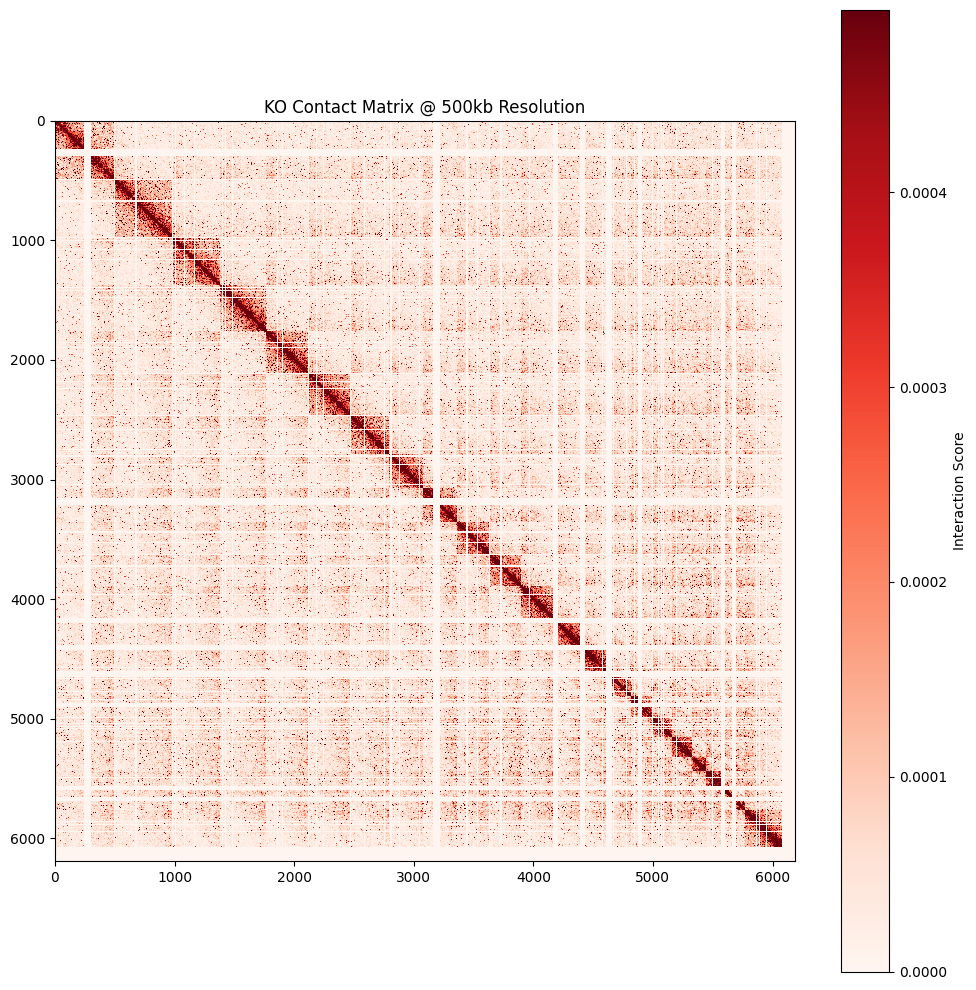

In [96]:
matrix_500kb = np.load('samples/boosted_all.npy')


vmax = np.nanpercentile(matrix_500kb, 98)



cmap = plt.cm.Reds
# plot whole thjing
plt.figure(figsize=(10, 10))
plt.imshow(matrix_500kb, cmap=cmap, interpolation='nearest', vmin=0, vmax=vmax)
plt.colorbar(label='Interaction Score')
plt.title("KO Contact Matrix @ 500kb Resolution")
plt.tight_layout()


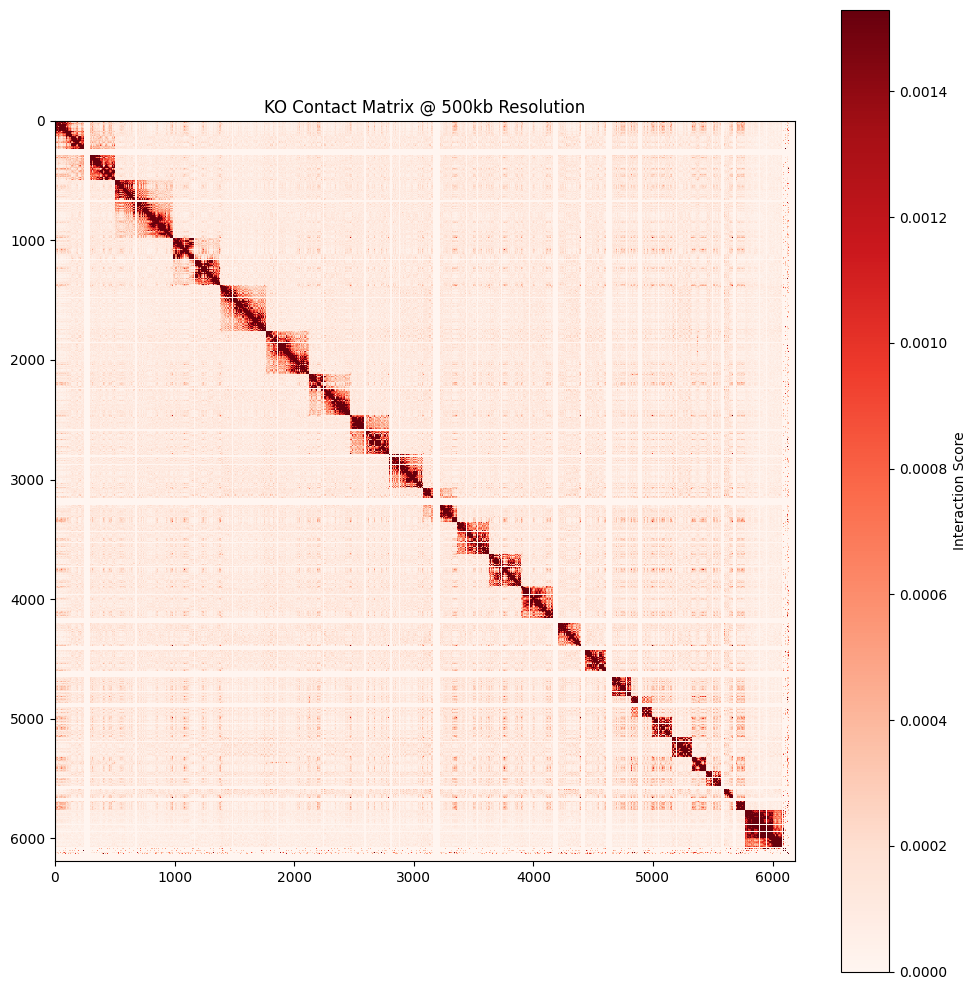

In [97]:
matrix_500kb = np.load('data/hic/full_contacts/wt_500kb_balanced.npy')
vmax = np.nanpercentile(matrix_500kb, 99)

cmap = plt.cm.Reds
# plot whole thjing
plt.figure(figsize=(10, 10))
plt.imshow(matrix_500kb, cmap=cmap, interpolation='nearest', vmin=0, vmax=vmax)
plt.colorbar(label='Interaction Score')
plt.title("KO Contact Matrix @ 500kb Resolution")
plt.tight_layout()

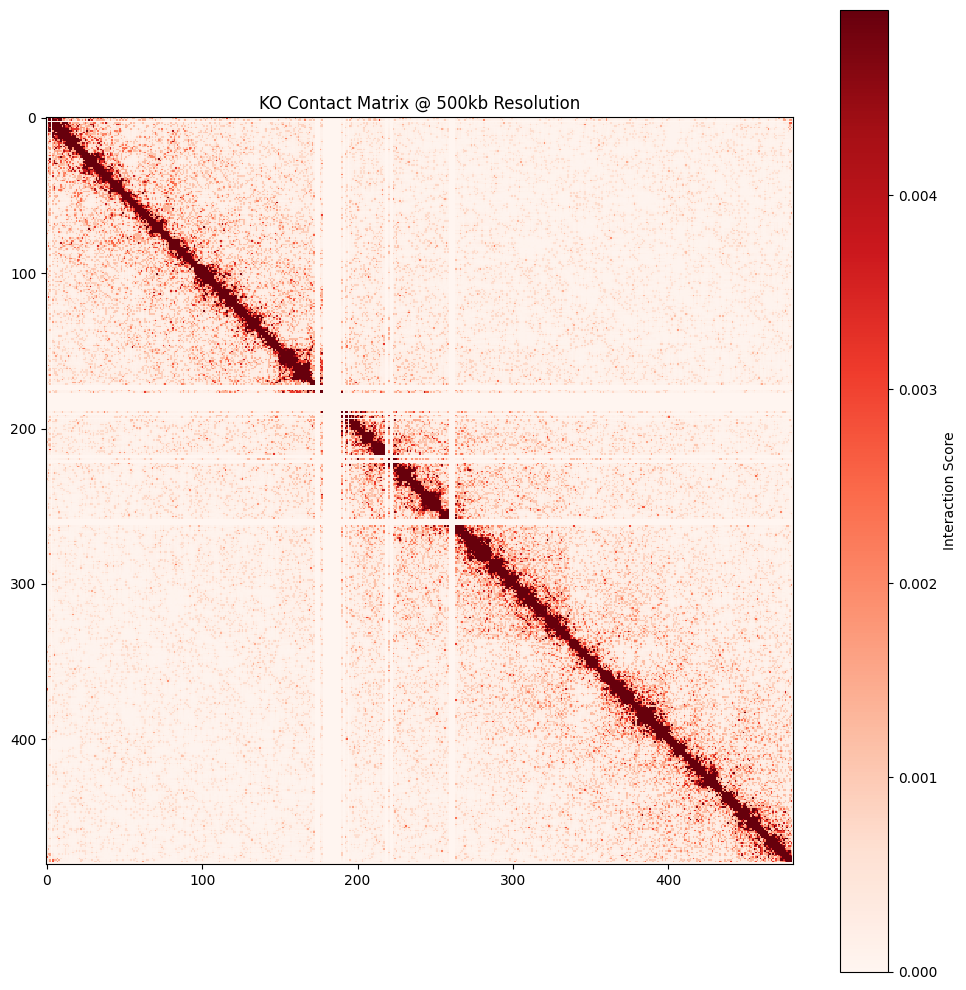

In [88]:
matrix_500kb = np.load('samples/boosted_500kb_chr2.npy')



vmax = np.nanpercentile(matrix_500kb, 98)



cmap = plt.cm.Reds
# plot whole thjing
plt.figure(figsize=(10, 10))
plt.imshow(matrix_500kb, cmap=cmap, interpolation='nearest', vmin=0, vmax=vmax)
plt.colorbar(label='Interaction Score')
plt.title("KO Contact Matrix @ 500kb Resolution")
plt.tight_layout()

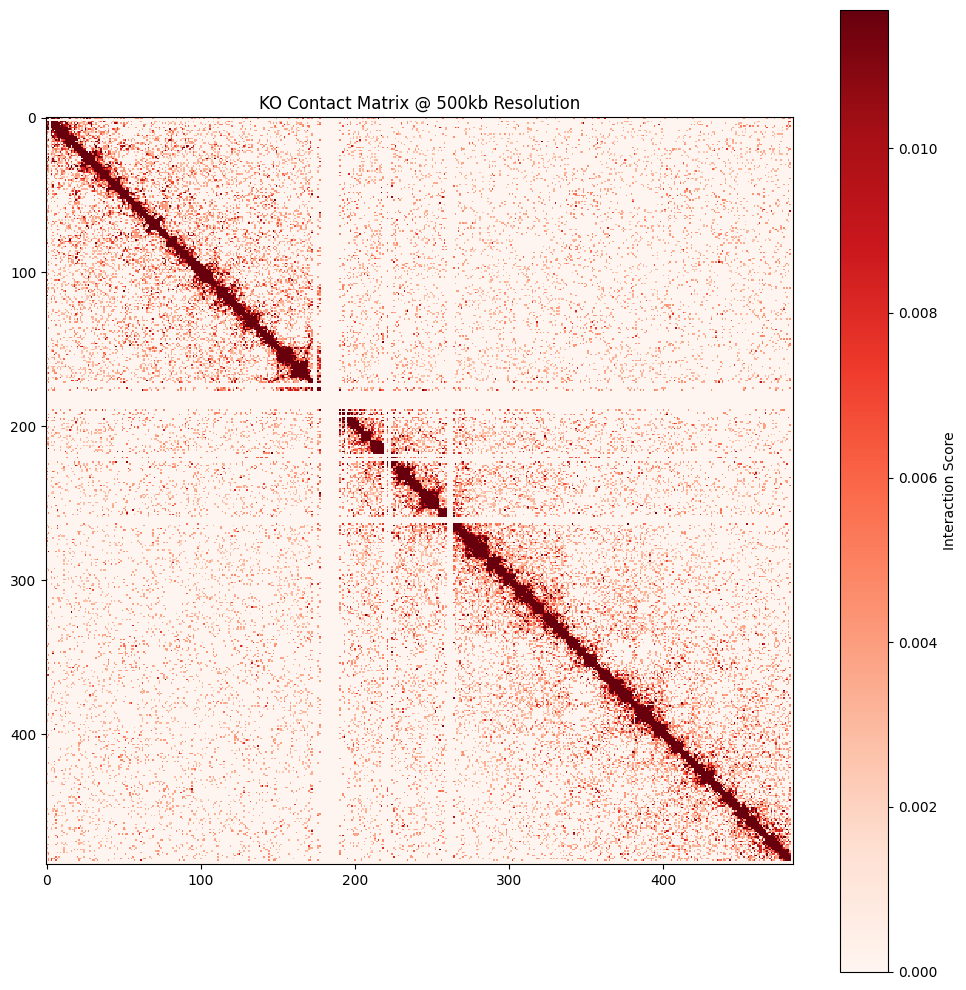

In [100]:
matrix_500kb = np.load('data/hic/full_contacts/knockout_500kb_balanced.npy')

matrix_500kb = matrix_500kb[498:983, 498:983]

vmax = np.nanpercentile(matrix_500kb, 98)



cmap = plt.cm.Reds
# plot whole thjing
plt.figure(figsize=(10, 10))
plt.imshow(matrix_500kb, cmap=cmap, interpolation='nearest', vmin=0, vmax=vmax)
plt.colorbar(label='Interaction Score')
plt.title("KO Contact Matrix @ 500kb Resolution")
plt.tight_layout()

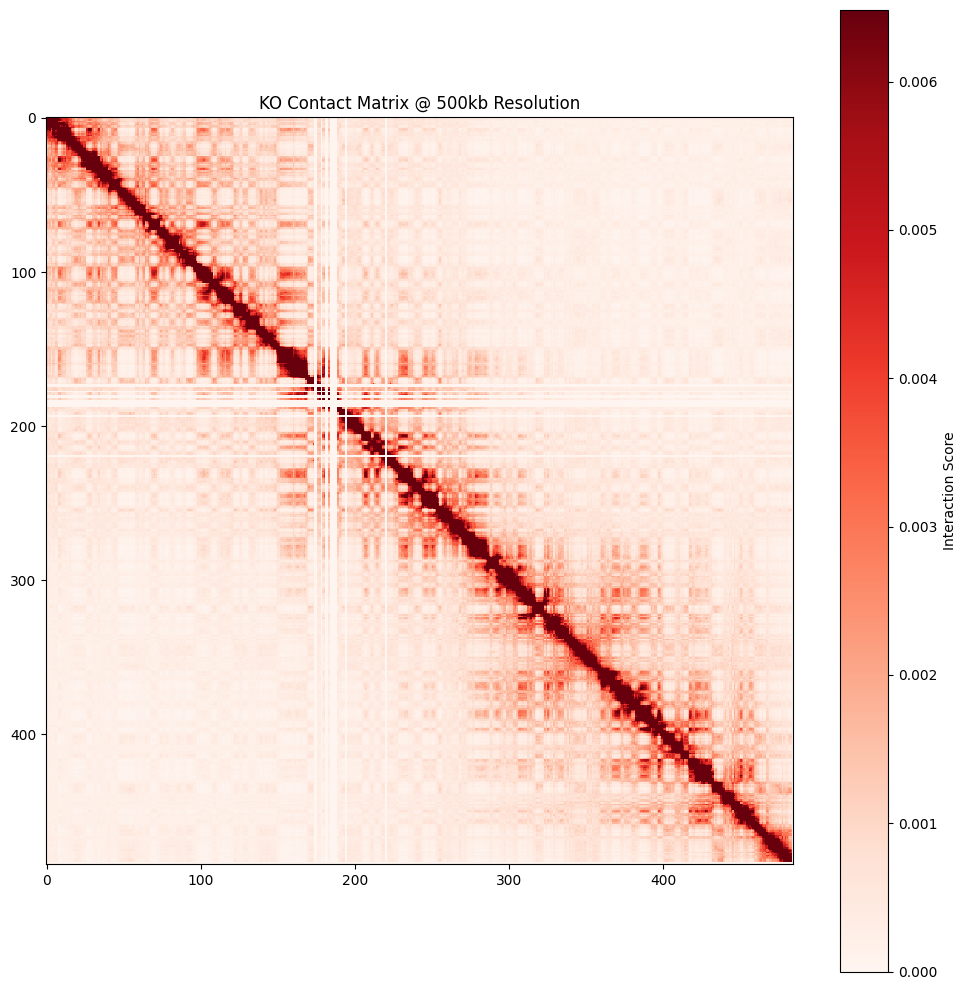

In [80]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Load and crop your region of interest
matrix_500kb = np.load('data/hic/full_contacts/wt_500kb_balanced.npy')
matrix_500kb = matrix_500kb[498:983, 498:983]

# Compute the 98th percentile to cap the color scale
vmax = np.nanpercentile(matrix_500kb, 98)

# Use white→red colormap and normalize from 0 up to vmax
cmap = plt.cm.Reds
norm = mcolors.Normalize(vmin=0, vmax=vmax)

# Plot the full matrix
plt.figure(figsize=(10, 10))
plt.imshow(matrix_500kb, cmap=cmap, norm=norm, interpolation='nearest')
plt.colorbar(label='Interaction Score')
plt.title("KO Contact Matrix @ 500kb Resolution")
plt.tight_layout()
plt.show()


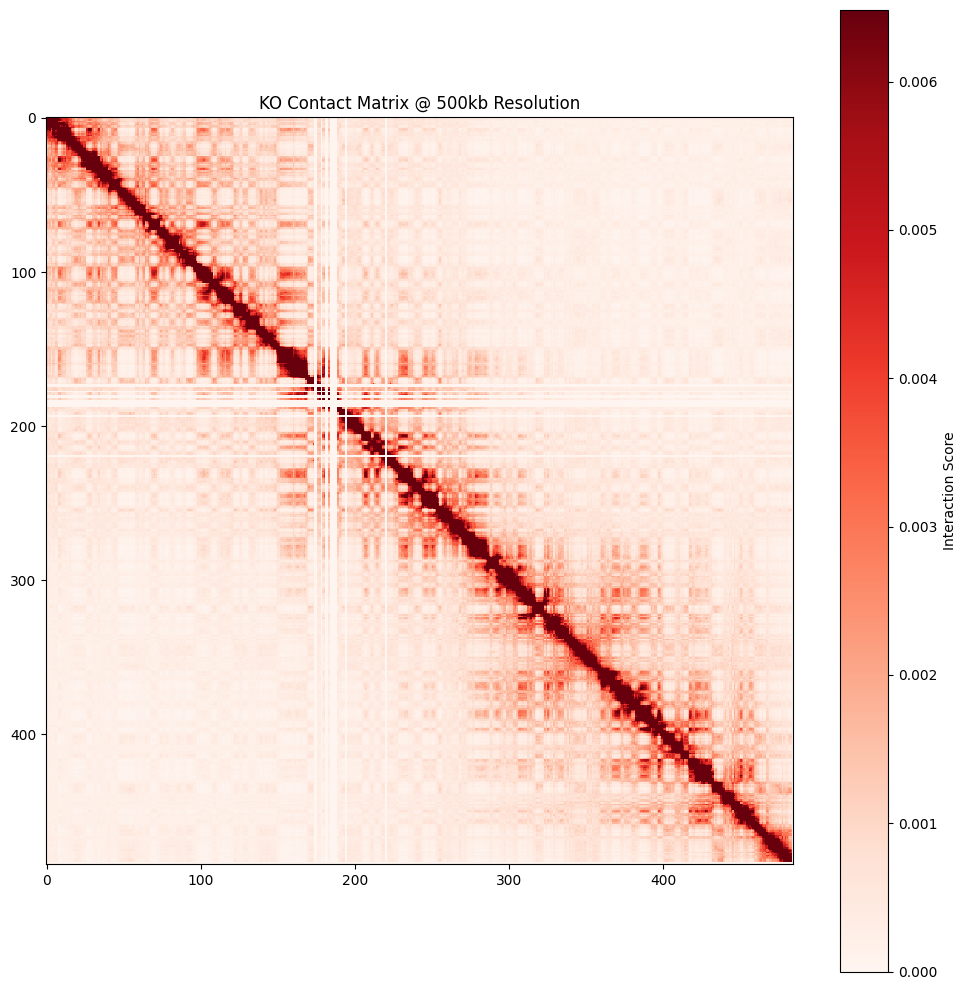

In [86]:
matrix_500kb = np.load('data/hic/full_contacts/wt_500kb_balanced.npy')

matrix_500kb = matrix_500kb[498:983, 498:983]

vmax = np.nanpercentile(matrix_500kb, 98)



cmap = plt.cm.Reds
# plot whole thjing
plt.figure(figsize=(10, 10))
plt.imshow(matrix_500kb, cmap=cmap, interpolation='nearest', vmin=0, vmax=vmax)
plt.colorbar(label='Interaction Score')
plt.title("KO Contact Matrix @ 500kb Resolution")
plt.tight_layout()


In [4]:
f.get_ttn_locus('mappings/gencode.v38.annotation.gtf')

{'chrom': 'chr2', 'start': 178525989, 'end': 178830802}

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import math

def plot_contact_matrix(
    matrix: np.ndarray,
    title: str,
    vmin: float = 0,
    vmax: float = 99,
    max_bins: int = 5000
):
    """
    Plots a contact matrix, automatically aggregating if it's too large.

    Parameters:
    - matrix: 2D numpy array of shape (N, N).
    - title: Title for the plot.
    - vmin: Minimum value for the color scale (default 0).
    - vmax: Percentile to use for the color scale’s maximum (default 99).
    - max_bins: Maximum number of bins per axis before aggregation kicks in (default 5000).
    """
    n_bins = matrix.shape[0]

    # Aggregate if above threshold
    if n_bins > max_bins:
        # compute how many original bins collapse into one
        factor = math.ceil(n_bins / max_bins)
        new_n = math.ceil(n_bins / factor)
        padded_size = new_n * factor
        pad_amt = padded_size - n_bins

        # pad with NaNs so that (n_bins + pad) is divisible by factor
        if pad_amt > 0:
            matrix = np.pad(
                matrix,
                ((0, pad_amt), (0, pad_amt)),
                mode='constant',
                constant_values=np.nan
            )

        # reshape into blocks and take the mean
        matrix = (
            matrix
            .reshape(new_n, factor, new_n, factor)
            .mean(axis=(1, 3))
        )

        n_bins = new_n

    # compute the  percentile‐based color ceiling
    vmax_val = np.nanpercentile(matrix, vmax)

    # plotting
    cmap = plt.cm.Reds
    cmap.set_bad(color='white')

    plt.figure(figsize=(10, 10))
    plt.imshow(matrix,
               cmap=cmap,
               interpolation='nearest',
               vmin=vmin,
               vmax=vmax_val)
    plt.colorbar(label='Interaction Score')
    plt.title(title)
    plt.tight_layout()
    plt.show()


In [47]:
import numpy as np
import matplotlib.pyplot as plt
import math

def plot_contact_matrix(
    matrix: np.ndarray,
    title: str,
    max_bins: int = 5000,
    vmin: float = 0,
    vmax: float = 99,
    genome_size_bp: int = 3_100_000_000,     # total length of human genome in bp
    n_ticks: int = 5                          # how many ticks on each axis
):
    """
    Plot a Hi-C contact matrix and label axes in genomic megabases.
    
    Parameters
    ----------
    matrix : np.ndarray
        Square contact matrix.
    title : str
        Plot title.
    max_bins : int, optional
        Maximum number of bins to display (will aggregate if larger).
    vmin : float, optional
        Minimum color scale value.
    vmax : float, optional
        Percentile for color scale maximum.
    genome_size_bp : int, optional
        Total genome length in base pairs (default ~3.1e9 for human).
    n_ticks : int, optional
        Number of tick marks per axis.
    """

    # --- (1) optionally aggregate large matrices ---
    n_bins = matrix.shape[0]
    if n_bins > max_bins:
        factor = math.ceil(n_bins / max_bins)
        new_n = math.ceil(n_bins / factor)
        pad_amt = new_n * factor - n_bins
        if pad_amt > 0:
            matrix = np.pad(
                matrix,
                ((0, pad_amt), (0, pad_amt)),
                mode='constant',
                constant_values=np.nan
            )
        matrix = matrix.reshape(new_n, factor, new_n, factor).mean(axis=(1,3))
        n_bins = new_n

    # --- (2) color scale ceiling at the given percentile ---
    vmax_val = np.nanpercentile(matrix, vmax)

    # --- (3) compute resolution (bp per bin) and tick positions/labels ---
    bp_per_bin = genome_size_bp / n_bins
    # tick positions in bin indices
    tick_bins = np.linspace(0, n_bins, num=n_ticks, endpoint=True)
    # convert to Mb
    tick_mbs = (tick_bins * bp_per_bin) / 1e6
    # format labels as integers or one decimal
    tick_labels = [f"{mb:.1f}" if mb < 10 else f"{int(mb)}" for mb in tick_mbs]

    # --- (4) set global font modern ---
    plt.rcParams.update({
        'font.family': 'sans-serif',
        'font.sans-serif': 'Arial',
        'font.size': 10
    })

    # --- (5) plot matrix ---
    fig, ax = plt.subplots(figsize=(8, 8))
    cmap = plt.cm.Reds
    cmap.set_bad(color='white')
    im = ax.imshow(
        matrix,
        cmap=cmap,
        interpolation='nearest',
        vmin=vmin,
        vmax=vmax_val,
        aspect='equal'
    )

    # --- (6) title & axis labels ---
    ax.set_title(title, fontsize=12)
    ax.set_xlabel("Genomic position (Mb)", labelpad=8)
    ax.set_ylabel("Genomic position (Mb)", labelpad=8)

    # --- (7) set ticks ---
    ax.set_xticks(tick_bins)
    ax.set_xticklabels(tick_labels)
    ax.set_yticks(tick_bins)
    ax.set_yticklabels(tick_labels)

    # --- (8) improved colorbar ---
    cbar = fig.colorbar(im, ax=ax, fraction=0.026, pad=0.04)    
    cbar.set_label("Interaction frequency", fontsize=10, labelpad=6)
    cbar.ax.tick_params(labelsize=10)

    plt.tight_layout()
    plt.show()


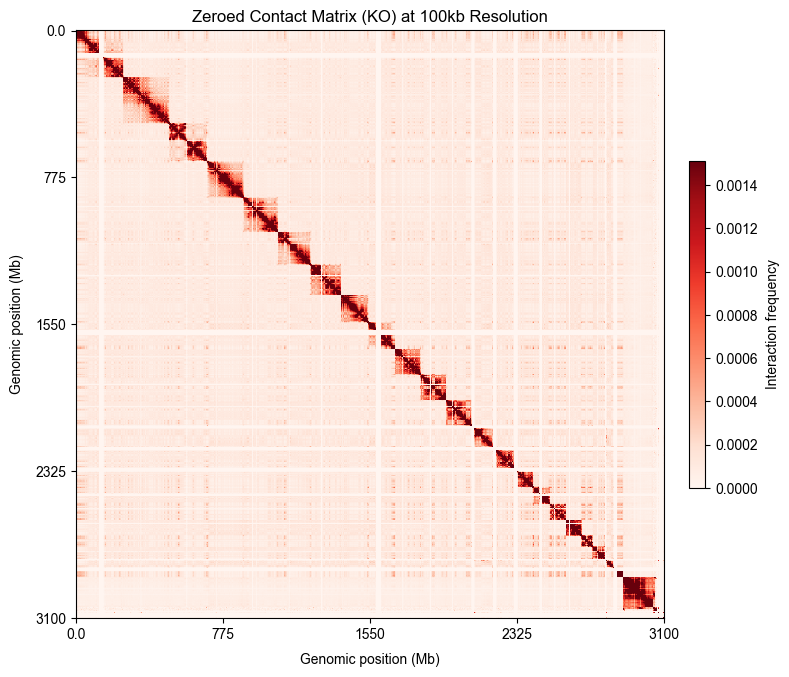

In [48]:
matrix = np.load('data/hic/full_contacts/wt_500kb_balanced.npy')

plot_contact_matrix(matrix, "Zeroed Contact Matrix (KO) at 100kb Resolution", max_bins=1000)


In [57]:
contact_matrix_zero = np.load('data/hic/wt_100kb_balanced_zeroed.npy')

In [60]:
len(bg_model_greedy_strong)

1000

Sampling cliques: 100%|██████████| 1000/1000 [04:07<00:00,  4.03iter/s]


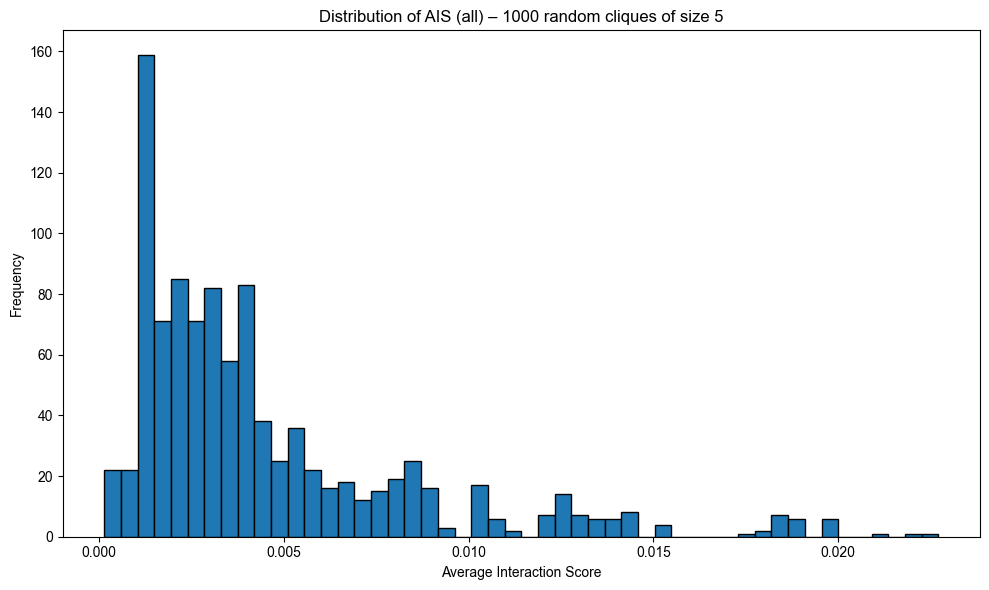

[0.0017018506435828753,
 0.0021446999876159776,
 0.0053959111704040665,
 0.001162536967800584,
 0.001162536967800584,
 0.001162536967800584,
 0.0034774004535561504,
 0.0023049339991886445,
 0.002292113298088966,
 0.0014078368221324773,
 0.0031985565578658316,
 0.005849036675250945,
 0.0035933314719294486,
 0.0066308263949153845,
 0.0028035796939958175,
 0.0018651148533508142,
 0.002206505635410519,
 0.001162536967800584,
 0.001162536967800584,
 0.0014288283815905001,
 0.0013678891858893813,
 0.006578422645601839,
 0.005382799599352786,
 0.011916115600640638,
 0.0020991872482192,
 0.003587823956855591,
 0.0015351486975312704,
 0.0033405652900404354,
 0.0013414615119250093,
 0.003316913903490902,
 0.0036658650834756577,
 0.0022842746023562523,
 0.001162536967800584,
 0.002912720395395193,
 0.01026849893098975,
 0.002402012763463625,
 0.001162536967800584,
 0.0028938015475874048,
 0.002130046897192251,
 0.004918209833927399,
 0.0042314081073574605,
 0.008561514019126578,
 0.00288069604676

In [61]:
background_model.create_greedy(contact_matrix_zero, 5, 1000, None, write=False)

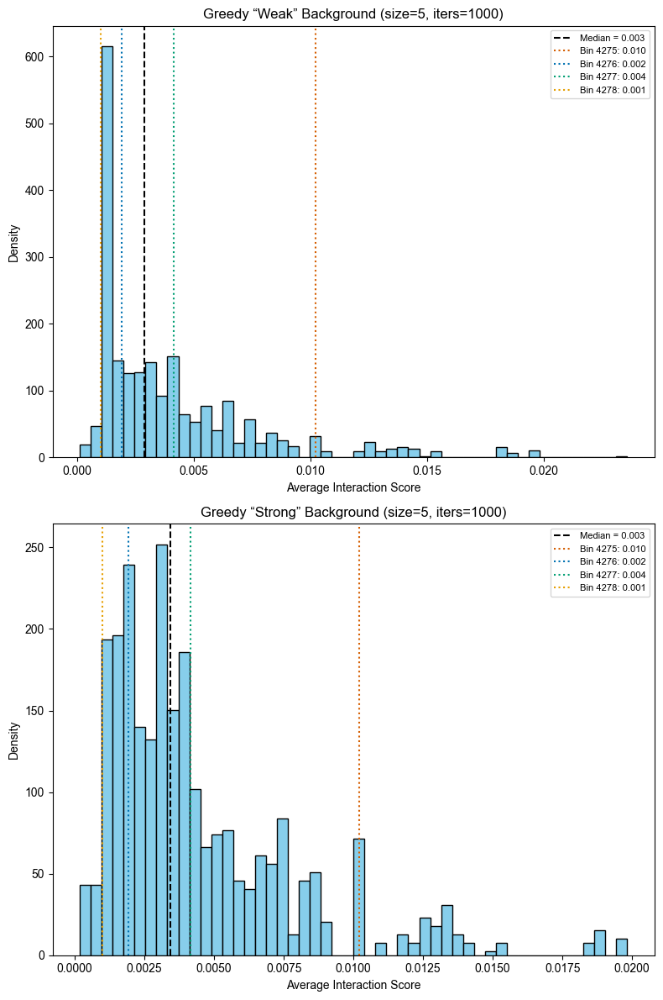

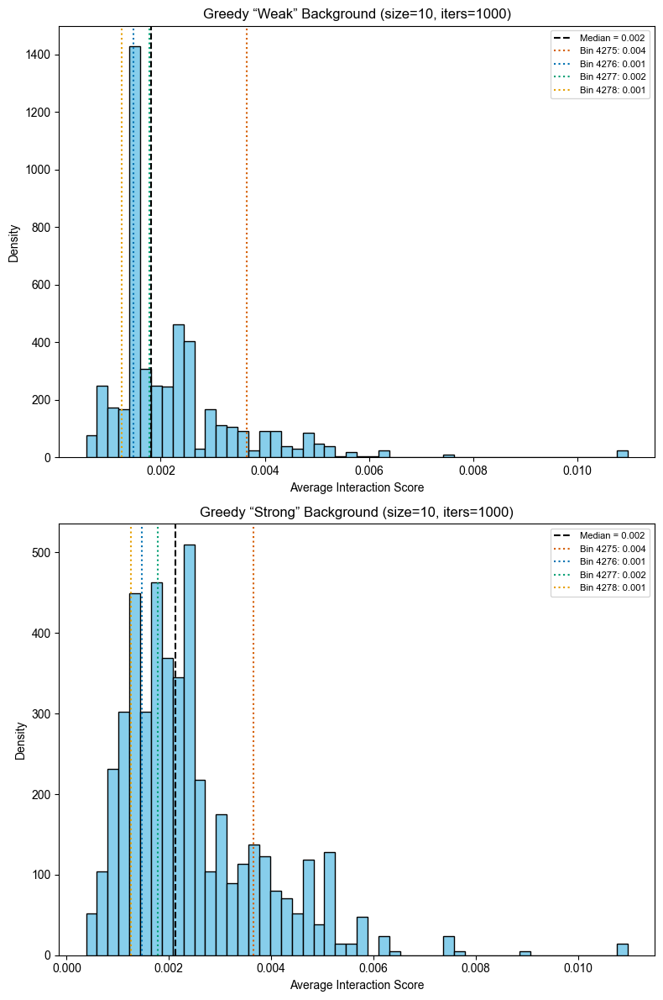

KeyboardInterrupt: 

In [81]:
clique_sizes = [5, 10, 20, 40]
num_iterations = 1000
ttn_bins = [4275, 4276, 4277, 4278]
colors = ['#D55E00', '#0072B2', '#009E73', '#E69F00']  # colorblind‐friendly

# load things once
bin_map = f.load_bin_map(BIN_MAP_PATH)
# make sure your contact matrix is defined too:
# contact_matrix_zero = ...

for size in clique_sizes:
    # compute the TTN clique scores
    ttn_cliques = [cf.find_greedy_clique(contact_matrix_zero, size, b) for b in ttn_bins]
    ttn_scores = [core.stats.calculate_avg_interaction_strength(contact_matrix_zero, clique)
                  for clique in ttn_cliques]

    # load & parse background distributions
    with open(f'background_models/greedy/greedy_scores_{size}_iterations_{num_iterations}_weak.txt',
              'r', encoding='utf-8') as f_weak:
        bg_weak = [float(line) for line in f_weak.read().splitlines()]

    with open(f'background_models/greedy/greedy_scores_{size}_iterations_{num_iterations}_strong.txt',
              'r', encoding='utf-8') as f_strong:
        bg_strong = [float(line) for line in f_strong.read().splitlines()]

    # make subplots
    fig, (ax_w, ax_s) = plt.subplots(2, 1, figsize=(8, 12))

    # Weak-background
    ax_w.hist(bg_weak, bins=50, density=True, color='skyblue', edgecolor='black')
    med_w = np.median(bg_weak)
    ax_w.axvline(med_w, color='k', linestyle='--', label=f'Median = {med_w:.3f}')
    for idx, (score, b) in enumerate(zip(ttn_scores, ttn_bins)):
        ax_w.axvline(score, color=colors[idx], linestyle=':', label=f'Bin {b}: {score:.3f}')
    ax_w.set_xlabel('Average Interaction Score')
    ax_w.set_ylabel('Density')
    ax_w.set_title(f'Greedy “Weak” Background (size={size}, iters={num_iterations})')
    ax_w.legend(loc='upper right', fontsize=8)

    # Strong-background
    ax_s.hist(bg_strong, bins=50, density=True, color='skyblue', edgecolor='black')
    med_s = np.median(bg_strong)
    ax_s.axvline(med_s, color='k', linestyle='--', label=f'Median = {med_s:.3f}')
    for idx, (score, b) in enumerate(zip(ttn_scores, ttn_bins)):
        ax_s.axvline(score, color=colors[idx], linestyle=':', label=f'Bin {b}: {score:.3f}')
    ax_s.set_xlabel('Average Interaction Score')
    ax_s.set_ylabel('Density')
    ax_s.set_title(f'Greedy “Strong” Background (size={size}, iters={num_iterations})')
    ax_s.legend(loc='upper right', fontsize=8)

    plt.tight_layout()
    plt.show()


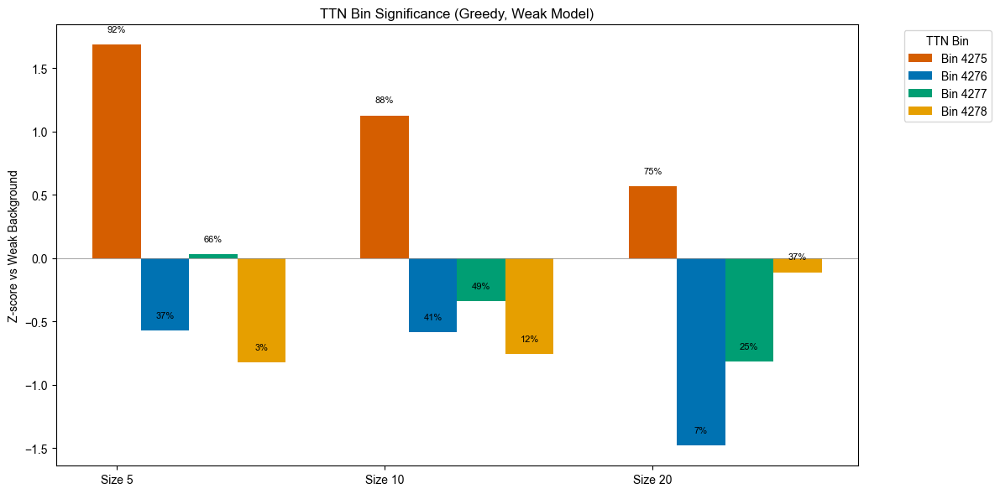

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import percentileofscore, zscore

clique_sizes = [5, 10, 20]
num_iterations = 1000
ttn_bins = [4275, 4276, 4277, 4278]
colors = ['#D55E00', '#0072B2', '#009E73', '#E69F00']  # colorblind‐friendly

bin_map = f.load_bin_map(BIN_MAP_PATH)
fig, ax = plt.subplots(figsize=(12, 6))

bar_width = 0.18
x_labels = []
xticks = []
all_heights = []

for i, size in enumerate(clique_sizes):
    # Compute scores
    ttn_cliques = [cf.find_greedy_clique(contact_matrix_zero, size, b) for b in ttn_bins]
    ttn_scores = [core.stats.calculate_avg_interaction_strength(contact_matrix_zero, c) for c in ttn_cliques]

    # Load background
    with open(f'background_models/greedy/greedy_scores_{size}_iterations_{num_iterations}_weak.txt', 'r') as f_weak:
        bg_weak = np.array([float(line) for line in f_weak])

    bg_mean, bg_std = np.mean(bg_weak), np.std(bg_weak)

    for j, (score, bin_id) in enumerate(zip(ttn_scores, ttn_bins)):
        z = (score - bg_mean) / bg_std
        percentile = percentileofscore(bg_weak, score)
        x = i + j * bar_width
        ax.bar(x, z, color=colors[j], width=bar_width, label=f'Bin {bin_id}' if i == 0 else "")
        ax.text(x, z + 0.1, f'{percentile:.0f}%', ha='center', fontsize=8)
        if i == 0:
            xticks.append(j * bar_width + 1.5)
            x_labels.append(f'Bin {bin_id}')

# Styling
ax.set_xticks(range(len(clique_sizes)))
ax.set_xticklabels([f'Size {s}' for s in clique_sizes])
ax.axhline(0, color='gray', linewidth=0.5)
ax.set_ylabel('Z-score vs Weak Background', fontsize=12)
ax.set_title('TTN Bin Significance (Greedy, Weak Model)')
ax.legend(title='TTN Bin', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


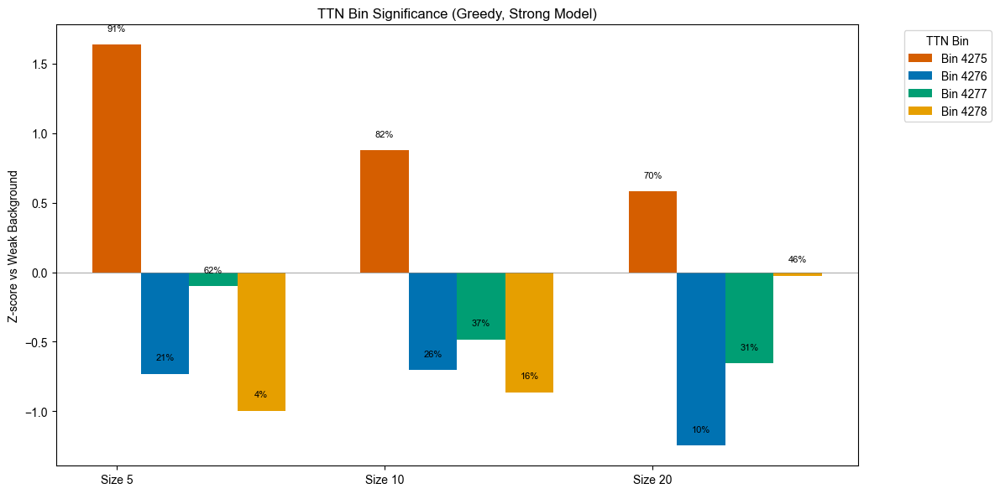

In [87]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import percentileofscore, zscore

clique_sizes = [5, 10, 20]
num_iterations = 1000
ttn_bins = [4275, 4276, 4277, 4278]
colors = ['#D55E00', '#0072B2', '#009E73', '#E69F00']  # colorblind‐friendly

bin_map = f.load_bin_map(BIN_MAP_PATH)
fig, ax = plt.subplots(figsize=(12, 6))

bar_width = 0.18
x_labels = []
xticks = []
all_heights = []

for i, size in enumerate(clique_sizes):
    # Compute scores
    ttn_cliques = [cf.find_greedy_clique(contact_matrix_zero, size, b) for b in ttn_bins]
    ttn_scores = [core.stats.calculate_avg_interaction_strength(contact_matrix_zero, c) for c in ttn_cliques]

    # Load background
    with open(f'background_models/greedy/greedy_scores_{size}_iterations_{num_iterations}_strong.txt', 'r') as f_weak:
        bg_weak = np.array([float(line) for line in f_weak])

    bg_mean, bg_std = np.mean(bg_weak), np.std(bg_weak)

    for j, (score, bin_id) in enumerate(zip(ttn_scores, ttn_bins)):
        z = (score - bg_mean) / bg_std
        percentile = percentileofscore(bg_weak, score)
        x = i + j * bar_width
        ax.bar(x, z, color=colors[j], width=bar_width, label=f'Bin {bin_id}' if i == 0 else "")
        ax.text(x, z + 0.1, f'{percentile:.0f}%', ha='center', fontsize=8)
        if i == 0:
            xticks.append(j * bar_width + 1.5)
            x_labels.append(f'Bin {bin_id}')

# Styling
ax.set_xticks(range(len(clique_sizes)))
ax.set_xticklabels([f'Size {s}' for s in clique_sizes])
ax.axhline(0, color='gray', linewidth=0.5)
ax.set_ylabel('Z-score vs Weak Background')
ax.set_title('TTN Bin Significance (Greedy, Strong Model)')
ax.legend(title='TTN Bin', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


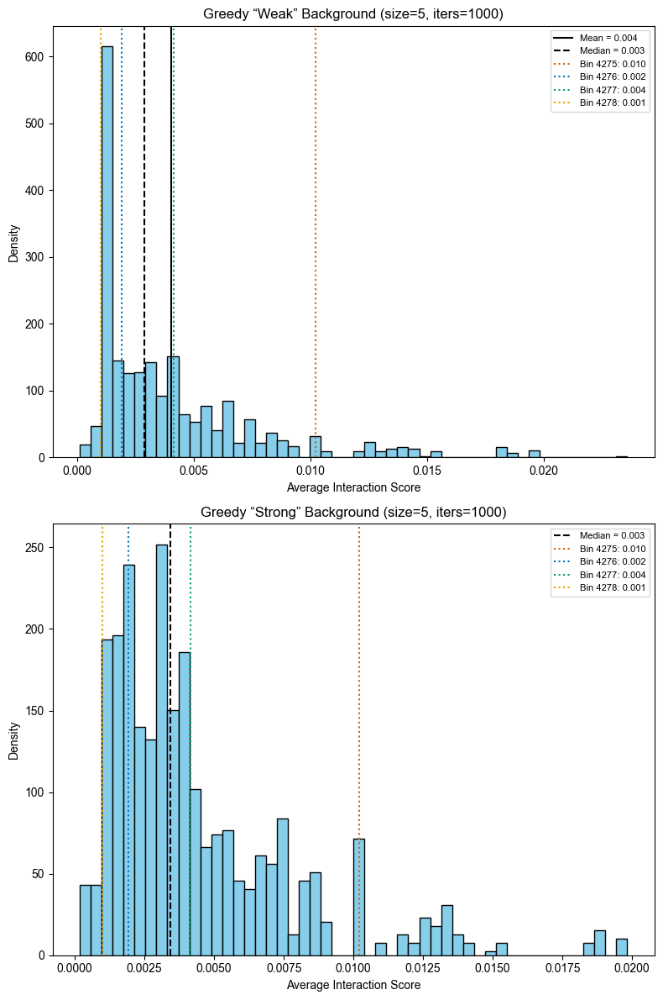

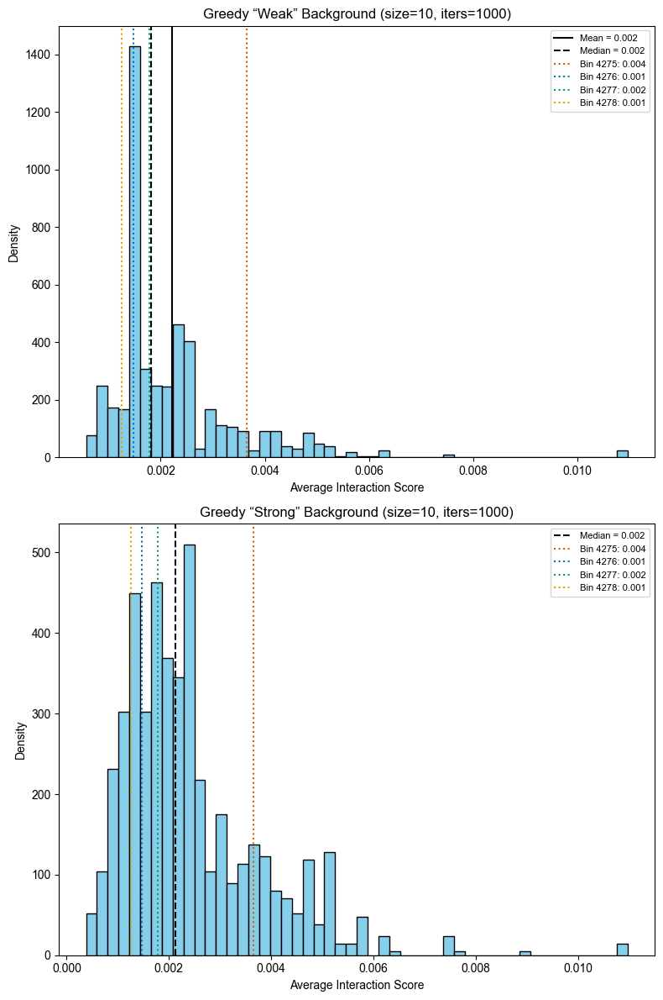

KeyboardInterrupt: 

In [ ]:


clique_sizes = [5, 10, 20, 40]
num_iterations = 1000
ttn_bins = [4275, 4276, 4277, 4278]
# colors = ['red', 'blue', 'green', 'orange'
colors          = ['#D55E00', '#0072B2', '#009E73', '#E69F00']  # colorblind‐friendly

# load things once
bin_map = f.load_bin_map(BIN_MAP_PATH)
# make sure your contact matrix is defined too:
# contact_matrix_zero = ...

for size in clique_sizes:
    # compute the TTN clique scores
    ttn_cliques = [cf.find_greedy_clique(contact_matrix_zero, size, b) for b in ttn_bins]
    ttn_scores  = [core.stats.calculate_avg_interaction_strength(contact_matrix_zero, clique)
                   for clique in ttn_cliques]
    

    # load & parse background distributions as floats
    with open(f'background_models/greedy/greedy_scores_{size}_iterations_{num_iterations}_weak.txt',
              'r', encoding='utf-8') as f_weak:
        bg_weak = [float(line) for line in f_weak.read().splitlines()]

    with open(f'background_models/greedy/greedy_scores_{size}_iterations_{num_iterations}_strong.txt',
              'r', encoding='utf-8') as f_strong:
        bg_strong = [float(line) for line in f_strong.read().splitlines()]

    # make subplots
    fig, (ax_w, ax_s) = plt.subplots(2, 1, figsize=(8, 12))

    # Weak-background
    ax_w.hist(bg_weak, bins=50, density=True, color='skyblue', edgecolor='black')
    mean_w, med_w = np.mean(bg_weak), np.median(bg_weak)
    ax_w.axvline(mean_w, color='k', linestyle='-',  label=f'Mean = {mean_w:.3f}')
    ax_w.axvline(med_w,  color='k', linestyle='--', label=f'Median = {med_w:.3f}')
    for idx, (score, b) in enumerate(zip(ttn_scores, ttn_bins)):
        ax_w.axvline(score, color=colors[idx], linestyle=':',
                     label=f'Bin {b}: {score:.3f}')
    ax_w.set_xlabel('Average Interaction Score')
    ax_w.set_ylabel('Density')
    ax_w.set_title(f'Greedy “Weak” Background (size={size}, iters={num_iterations})')
    ax_w.legend(loc='upper right', fontsize=8)

    # Strong-background
    ax_s.hist(bg_strong, bins=50, density=True, color='skyblue', edgecolor='black')
    mean_s, med_s = np.mean(bg_strong), np.median(bg_strong)
    ax_s.axvline(mean_s, color='k', linestyle='-',  label=f'Mean = {mean_s:.3f}')
    ax_s.axvline(med_s,  color='k', linestyle='--', label=f'Median = {med_s:.3f}')
    for idx, (score, b) in enumerate(zip(ttn_scores, ttn_bins)):
        ax_s.axvline(score, color=colors[idx], linestyle=':',
                     label=f'Bin {b}: {score:.3f}')
    ax_s.set_xlabel('Average Interaction Score')
    ax_s.set_ylabel('Density')
    ax_s.set_title(f'Greedy “Strong” Background (size={size}, iters={num_iterations})')
    ax_s.legend(loc='upper right', fontsize=8)

    plt.tight_layout()
    plt.show()


## Clique Size vs P Value Graphs

Sampling cliques: 100%|███████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:03<00:00, 3088.62iter/s]


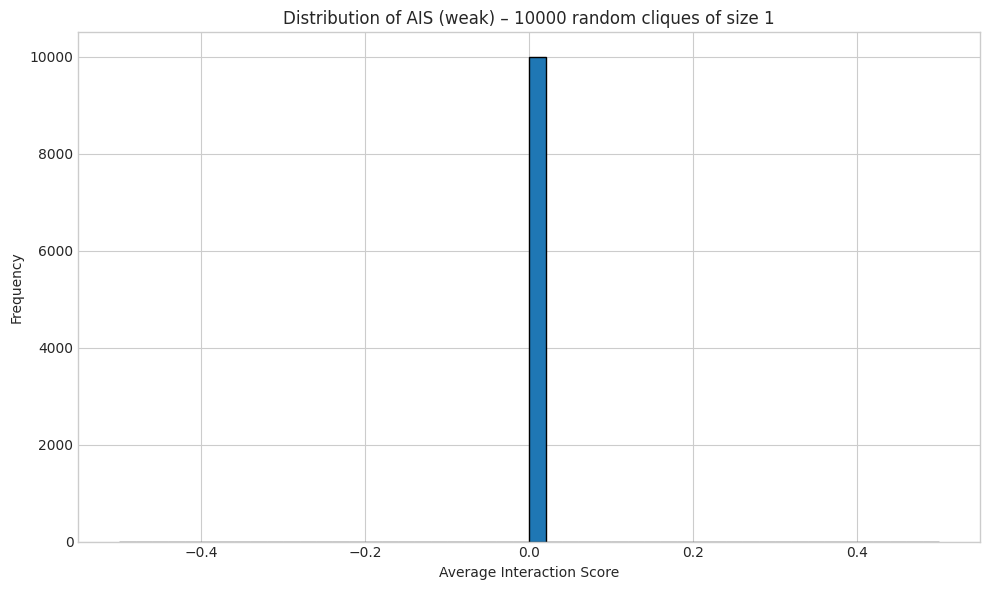

Sampling cliques: 100%|███████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1213.35iter/s]


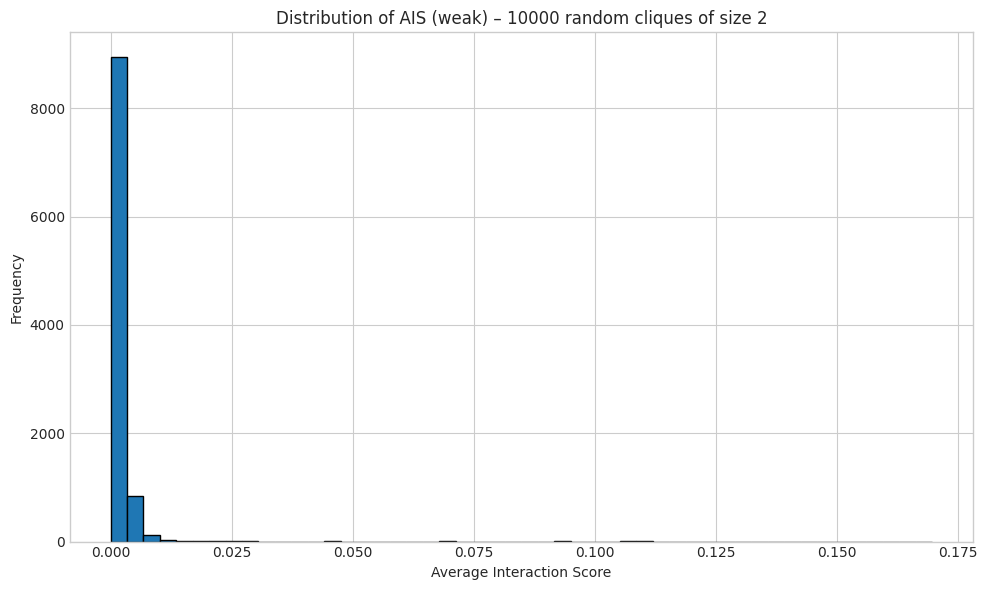

Sampling cliques: 100%|████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:16<00:00, 616.19iter/s]


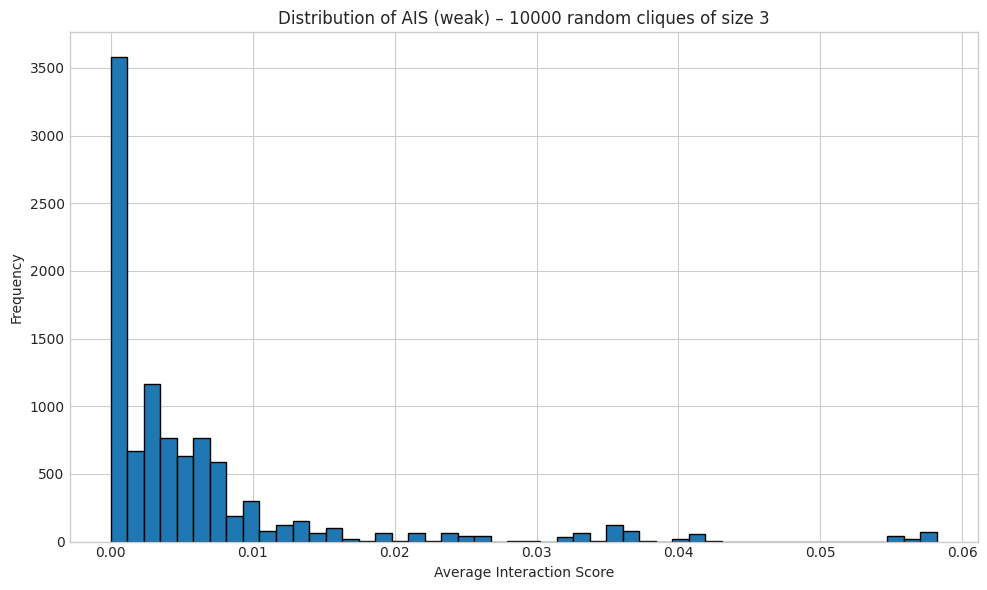

Sampling cliques: 100%|████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.56iter/s]


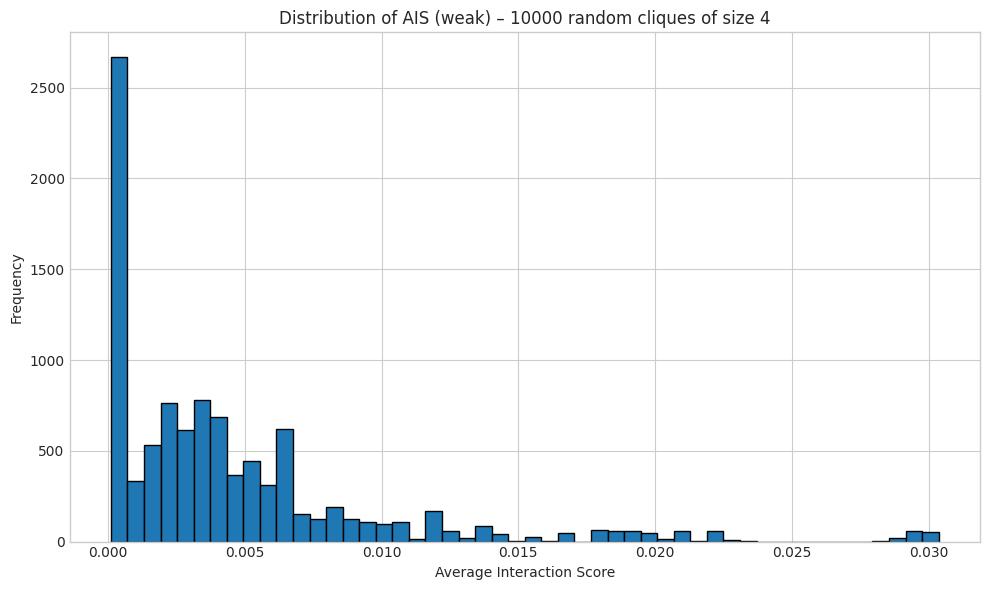

Sampling cliques: 100%|████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:37<00:00, 269.35iter/s]


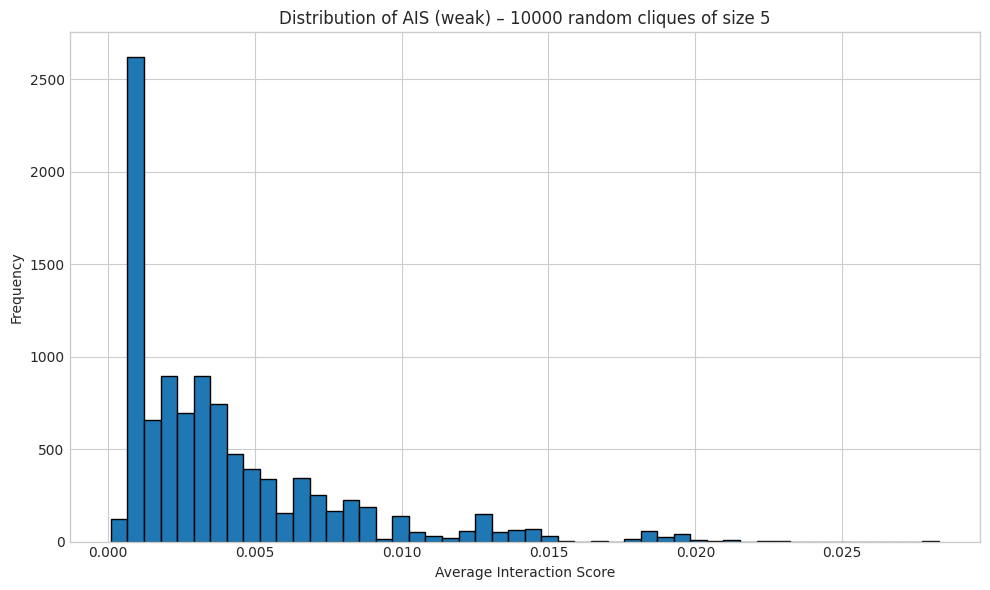

Sampling cliques: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [01:58<00:00, 84.34iter/s]


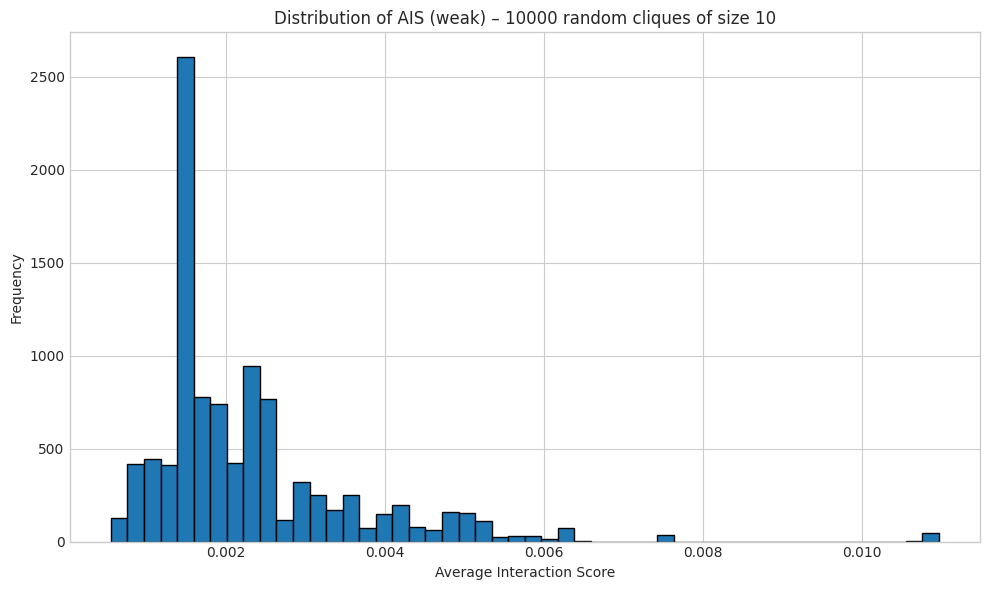

Sampling cliques: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [07:46<00:00, 21.42iter/s]


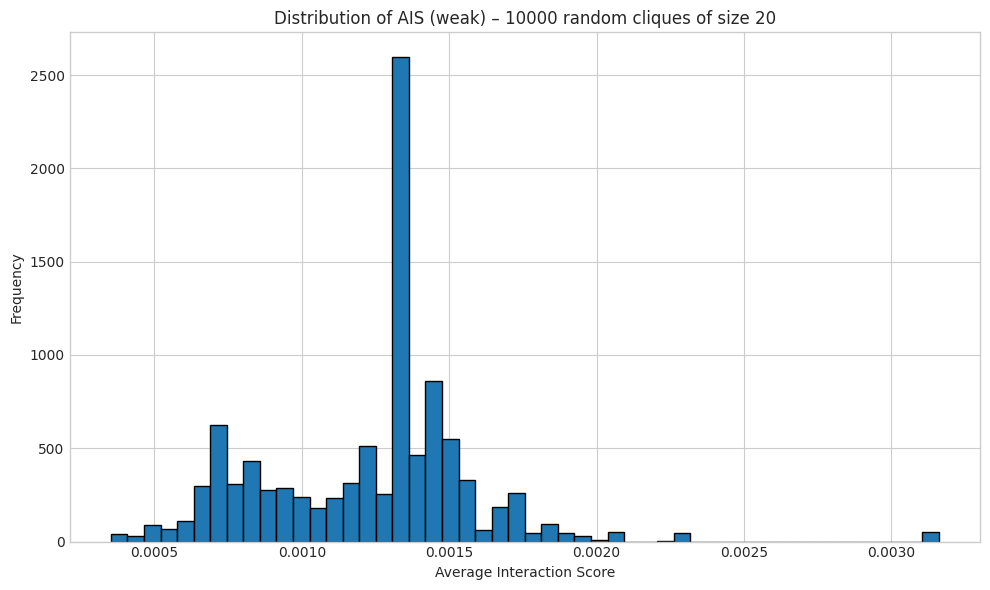

Sampling cliques: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [20:54<00:00,  7.97iter/s]


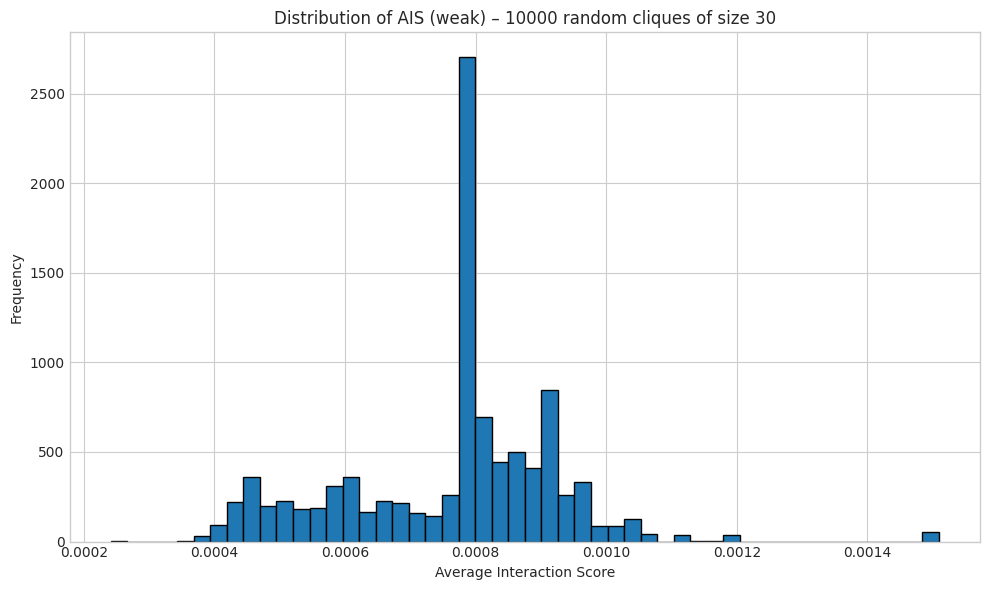

Sampling cliques:   1%|▉                                                                                                   | 91/10000 [00:22<41:17,  4.00iter/s]

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.style.use('seaborn-v0_8-whitegrid')  # Clean modern look

# Parameters
sizes_strong = [1,2,3,4, 5, 10, 20, 30, 40]
sizes_weak   = [1,2,3,4, 5, 10, 20, 30, 40]
sizes_plain  = [1,2,3,4, 5, 10, 20, 30, 40]
contact_matrix_zero = np.load('data/hic/wildtype_100kb_zeroed.npy')
TTN_BIN = 4275  # Adjust as needed
NUM_ITERATIONS = 10000   

# Helper to compute p-values
def compute_p_values(sizes, suffix):
    p_vals = []
    for size in sizes:
        if suffix == 'strong':
            bg_scores = background_model.create_greedy(contact_matrix_zero, size, NUM_ITERATIONS, bins=gene_bins, label='strong')
        elif suffix == 'weak':
            bg_scores = background_model.create_greedy(contact_matrix_zero, size, NUM_ITERATIONS, bins=non_gene_bins, label='weak')
        else:
            bg_scores = background_model.create_greedy(contact_matrix_zero, size, NUM_ITERATIONS, bins=None)
        nodes = cf.find_greedy_clique(contact_matrix_zero, size, TTN_BIN)
        score = core.stats.calculate_avg_interaction_strength(contact_matrix_zero, nodes)
        p_vals.append(core.stats.empirical_p_value(score, bg_scores))
    return p_vals

# Compute p-values
# p_strong = compute_p_values(sizes_strong, 'strong')
p_weak   = compute_p_values(sizes_weak,   'weak')
p_plain  = compute_p_values(sizes_plain,  '')

# Plot
fig, ax = plt.subplots(figsize=(8, 5))

ax.plot(sizes_strong, p_strong, marker='o', linestyle='-', label='Strong', linewidth=2)
ax.plot(sizes_weak,   p_weak,   marker='s', linestyle='--', label='Weak', linewidth=2)
ax.plot(sizes_plain,  p_plain,  marker='^', linestyle=':', label='All', linewidth=2)

# Labels and threshold
ax.set_xlabel('Clique Size', fontsize=12)
ax.set_ylabel('empirical p-value (log scale)', fontsize=12)
ax.set_yscale('log')
ax.axhline(0.10, color='red', linestyle='--', linewidth=1.5, label='α = 0.10')

# Annotate points
for (sizes, p_vals, valign) in [
    (sizes_strong, p_strong, 'bottom'),
    (sizes_weak,   p_weak,   'top'),
    (sizes_plain,  p_plain,  'center')
]:
    for x, y in zip(sizes, p_vals):
        ax.annotate(f"{y:.1e}", (x, y), textcoords="offset points", 
                    xytext=(0, 6 if valign == 'bottom' else -10),
                    ha='center', fontsize=9)

# Final polish
ax.legend(frameon=False, fontsize=10)
ax.tick_params(axis='both', labelsize=10)
fig.tight_layout()
plt.show()

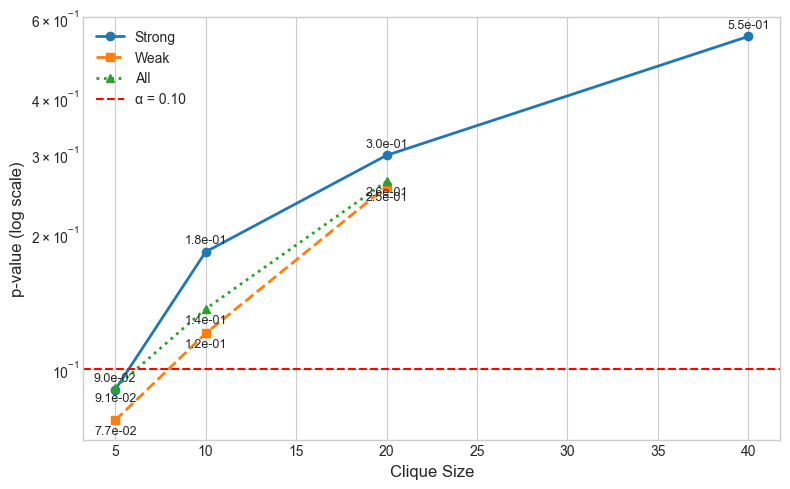

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.style.use('seaborn-v0_8-whitegrid')  # Clean modern look

# Parameters
sizes_strong = [5, 10, 20, 40]
sizes_weak   = [5, 10, 20]
sizes_plain  = [5, 10, 20]
contact_matrix_zero = np.load('data/hic/wt_100kb_balanced_zeroed.npy')
TTN_BIN = 4275  # Adjust as needed

# Helper to compute p-values
def compute_p_values(sizes, suffix):
    p_vals = []
    for size in sizes:
        filename = (
            f'/Users/ethan/Desktop/chromatin-heart-dev/'
            f'background_models/greedy/greedy_scores_{size}_iterations_1000'
        )
        if suffix:
            filename += f'_{suffix}'
        filename += '.txt'

        with open(filename, 'r') as bg_file:
            bg_scores = [float(line) for line in bg_file]

        nodes = cf.find_greedy_clique(contact_matrix_zero, size, TTN_BIN)
        score = core.stats.calculate_avg_interaction_strength(contact_matrix_zero, nodes)
        p_vals.append(core.stats.empirical_p_value(score, bg_scores))
    return p_vals

# Compute p-values
p_strong = compute_p_values(sizes_strong, 'strong')
p_weak   = compute_p_values(sizes_weak,   'weak')
p_plain  = compute_p_values(sizes_plain,  '')

# Plot
fig, ax = plt.subplots(figsize=(8, 5))

ax.plot(sizes_strong, p_strong, marker='o', linestyle='-', label='Strong', linewidth=2)
ax.plot(sizes_weak,   p_weak,   marker='s', linestyle='--', label='Weak', linewidth=2)
ax.plot(sizes_plain,  p_plain,  marker='^', linestyle=':', label='All', linewidth=2)

# Labels and threshold
ax.set_xlabel('Clique Size', fontsize=12)
ax.set_ylabel('empirical p-value (log scale)', fontsize=12)
ax.set_yscale('log')
ax.axhline(0.10, color='red', linestyle='--', linewidth=1.5, label='α = 0.10')

# Annotate points
for (sizes, p_vals, valign) in [
    (sizes_strong, p_strong, 'bottom'),
    (sizes_weak,   p_weak,   'top'),
    (sizes_plain,  p_plain,  'center')
]:
    for x, y in zip(sizes, p_vals):
        ax.annotate(f"{y:.1e}", (x, y), textcoords="offset points", 
                    xytext=(0, 6 if valign == 'bottom' else -10),
                    ha='center', fontsize=9)

# Final polish
ax.legend(frameon=False, fontsize=10)
ax.tick_params(axis='both', labelsize=10)
fig.tight_layout()
plt.show()

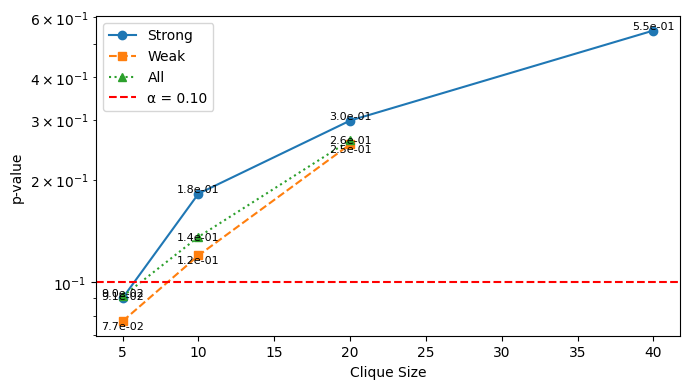

In [10]:
import matplotlib.pyplot as plt
import numpy as np

# Parameters
sizes_strong = [5, 10, 20, 40]
sizes_weak   = [5, 10, 20]
sizes_plain  = [5, 10, 20]
contact_matrix_zero = np.load('data/hic/wt_100kb_balanced_zeroed.npy')
TTN_BIN = 4275  # adjust if needed

# Helper to compute p-values
def compute_p_values(sizes, suffix):
    p_vals = []
    for size in sizes:
        filename = (
            f'/Users/ethan/Desktop/chromatin-heart-dev/'
            f'background_models/greedy/greedy_scores_{size}_iterations_1000'
        )
        if suffix:
            filename += f'_{suffix}'
        filename += '.txt'

        with open(filename, 'r') as bg_file:
            bg_scores = [float(line) for line in bg_file]

        nodes = cf.find_greedy_clique(contact_matrix_zero, size, TTN_BIN)
        score = core.stats.calculate_avg_interaction_strength(contact_matrix_zero, nodes)
        p_vals.append(core.stats.empirical_p_value(score, bg_scores))
    return p_vals

# Compute p-values
p_strong = compute_p_values(sizes_strong, 'strong')
p_weak   = compute_p_values(sizes_weak,   'weak')
p_plain  = compute_p_values(sizes_plain,  '')

# Plot
plt.figure(figsize=(7, 4))
plt.plot(sizes_strong, p_strong, marker='o', linestyle='-', label='Strong')
plt.plot(sizes_weak,   p_weak,   marker='s', linestyle='--', label='Weak')
plt.plot(sizes_plain,  p_plain,  marker='^', linestyle=':', label='All')

plt.xlabel('Clique Size')
plt.ylabel('p-value')
plt.yscale('log')
plt.axhline(0.10, color='r', linestyle='--', label='α = 0.10')

# Annotate points
for (sizes, p_vals, valign) in [
    (sizes_strong, p_strong, 'bottom'),
    (sizes_weak,   p_weak,   'top'),
    (sizes_plain,  p_plain,  'center')
]:
    for x, y in zip(sizes, p_vals):
        plt.text(x, y, f"{y:.1e}", ha='center', va=valign, fontsize=8)

plt.legend()
plt.tight_layout()
plt.show()

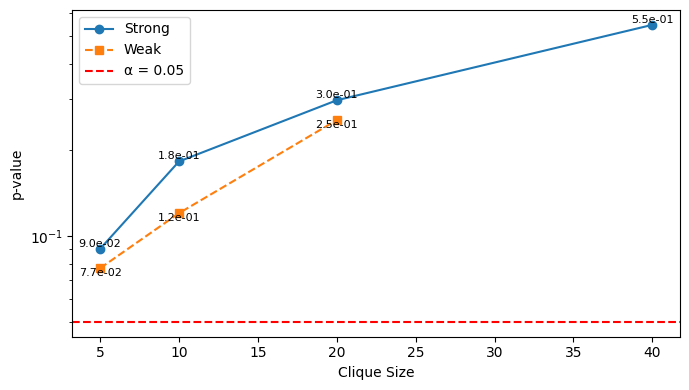

In [5]:
import matplotlib.pyplot as plt


sizes_strong = [5, 10, 20, 40]
sizes_weak   = [5, 10, 20]
contact_matrix_zero = np.load('data/hic/wt_100kb_balanced_zeroed.npy')

# Compute strong p‑values
p_strong = []
for size in sizes_strong:
    with open(
        f'/Users/ethan/Desktop/chromatin-heart-dev/'
        f'background_models/greedy/greedy_scores_{size}_iterations_1000_strong.txt',
        'r'
    ) as strong_bg_file:
        bg_scores_strong = [float(line) for line in strong_bg_file]

    nodes = cf.find_greedy_clique(contact_matrix_zero, size, TTN_BIN)
    score = core.stats.calculate_avg_interaction_strength(contact_matrix_zero, nodes)
    p_strong.append(core.stats.empirical_p_value(score, bg_scores_strong))

# Compute weak p‑values
p_weak = []
for size in sizes_weak:
    with open(
        f'/Users/ethan/Desktop/chromatin-heart-dev/'
        f'background_models/greedy/greedy_scores_{size}_iterations_1000_weak.txt',
        'r'
    ) as weak_bg_file:
        bg_scores_weak = [float(line) for line in weak_bg_file]

    # reuse the same nodes/score or recompute if you prefer:
    nodes = cf.find_greedy_clique(contact_matrix_zero, size, TTN_BIN)
    score = core.stats.calculate_avg_interaction_strength(contact_matrix_zero, nodes)
    p_weak.append(core.stats.empirical_p_value(score, bg_scores_weak))

# Plot both series
plt.figure(figsize=(7,4))
plt.plot(sizes_strong, p_strong, marker='o', linestyle='-', label='Strong')
plt.plot(sizes_weak,   p_weak,   marker='s', linestyle='--', label='Weak')

plt.xlabel('Clique Size')
plt.ylabel('p-value')
plt.yscale('log')
plt.axhline(0.05, color='r', linestyle='--', label='α = 0.05')

# Annotate points
for x, y in zip(sizes_strong, p_strong):
    plt.text(x, y, f"{y:.1e}", ha='center', va='bottom', fontsize=8)
for x, y in zip(sizes_weak, p_weak):
    plt.text(x, y, f"{y:.1e}", ha='center', va='top',    fontsize=8)

plt.legend()
plt.tight_layout()
plt.show()